# Graph Signal Processing

## Part 1

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

from numpy import linalg as LA
from numpy.random import rand

import pandas as pd

### Question 1, MyVertexSelection:

##### First, we define a graph object:

In [400]:
class Graph:
    
    def __init__(self, laplacian_matrix):
            
        self.laplacian = laplacian_matrix
        
        self.weights = np.diag(np.diag(laplacian_matrix)) - laplacian_matrix
            
    def get_coords(self, coords):
        
        self.coords = coords
        
    def draw_graph(self):
        
        plt.rcParams["figure.figsize"] = [20.00, 20.00]
        plt.rcParams["figure.autolayout"] = True

        x = self.coords[:, 0]
        y = self.coords[:, 1]

        for i in range(len(x)):

            plt.plot(y[i], x[i], marker="o", markeredgecolor="red", markerfacecolor="green")

            for j in range(i + 1, len(x)):

                if self.weights[i, j] != 0:

                    x_, y_ = line_generator(y[i], x[i], self.coords[j, 1], self.coords[j, 0], 1000)
        #             print(len(x_), len(y_))
                    plt.plot(x_[0 : np.min((len(x_), len(y_)))], y_[0 : np.min((len(x_), len(y_)))])
            
        plt.show()
            
    def plot_signal(self, signal, fontsize_):
        
        plt.rcParams["figure.figsize"] = [20.00, 20.00]
        plt.rcParams["figure.autolayout"] = True

        x = self.coords[:, 0]
        y = self.coords[:, 1]

        for i in range(len(x)):

            plt.plot(y[i], x[i], marker="o", markeredgecolor="red", markerfacecolor="green")
            plt.text(y[i], x[i], str(signal[i]), fontsize = fontsize_)

            for j in range(i + 1, len(x)):

                if self.laplacian[i, j] != 0:

                    x_, y_ = line_generator(y[i], x[i], self.coords[j, 1], self.coords[j, 0], 1000)
        #             print(len(x_), len(y_))
                    plt.plot(x_[0 : np.min((len(x_), len(y_)))], y_[0 : np.min((len(x_), len(y_)))])
        
        plt.show()
        
def line_generator(x1, y1, x2, y2, n):
    
    x_axis = np.arange(x1, x2, (x2 - x1) / n)
    y_axis = np.arange(y1, y2, (y2 - y1) / n)
    
    return x_axis, y_axis

##### Then, implemet vertex selection!

In [232]:
def myvertexselection(G):
    
    eigenvalues, eigenvectors = LA.eig(np.array(G.laplacian))
#     print(len(G.laplacian))
#     print(eigenvectors)
#     print(eigenvalues)
    
    maximum_eigval_i = np.argmax(eigenvalues)
#     print(maximum_eigval_i)

    eigvec_max = eigenvectors[:, maximum_eigval_i]
#     print(eigvec_max)

#     index_rejection_array = np.heaviside(eigvec_max, 1)
#     print(index_rejection)
    
#     print(np.array(np.where(eigvec_max >= 1)[0]))
    
    return np.array(np.where(eigvec_max >= 0)[0]), np.array(np.where(eigvec_max < 0)[0])

### Question 2, MySKReduction:

##### Now we implement this function:

In [177]:
def MySKReduction(laplacian, v_1, v_1_c): # v_1 are indices to keep and v_1_c are indices to remove
    
    KronReducted_1 = Laplacian_A_B(laplacian, v_1, v_1)
    
    negative_term = Laplacian_A_B(laplacian, v_1, v_1_c)
    negative_term = np.dot(negative_term, LA.pinv(Laplacian_A_B(laplacian, v_1_c, v_1_c)))
    negative_term = np.dot(negative_term, Laplacian_A_B(laplacian, v_1_c, v_1))
    
    return KronReducted_1 - negative_term

def Laplacian_A_B(lap, A, B):
    
    Reducted_L = np.zeros((len(A), len(B)))
    
    for i in range(len(A)):
        for j in range(len(B)):
            
            Reducted_L[i, j] = lap[A[i], B[j]]
    
    return np.array(Reducted_L)

### Question 3, MyHFilter:
##### Now, we use graph to define h filter, and filter given signal:

In [5]:
def MyHFilter(G, x):
    
    eigenvalues, u = LA.eig(G.laplacian)
    
    h_hat = 1 / (1 + 2 * eigenvalues)
    
#     print(h_hat)
    
    return np.dot(u, np.dot(np.diag(h_hat), np.dot(LA.inv(u), x)))

### Question 4, MyDS:
#### in this step, we should downsample given signal:

In [6]:
def MyDS(x, v_1):
    
    x_ = np.zeros_like(v_1)
    
    for i in range(len(x_)):
        
        x_[i] = x[v_1[i]]
    
    return x_

### ًQuestion 5, MyInterpolate:

#### Now, we should upsample/interpolate our signal!

In [7]:
def myInterpolate(x_d, v_1, G, flag, k):
    
    if flag == 0:
        
        return article_interpolate(x_d, v_1, G)
    
    else:
        
        if flag == 1:
            
            return notes_interpolate(x_d, v_1, G, k)
        
######################################
        
def notes_interpolate(x_d, v_1, G, k):
    
    lambd, u = LA.eig(G.laplacian)
    
    u_k = u[:, 0 : k]
    
    u_tild = np.zeros((len(v_1), len(u_k)))
    
    for i in range(len(v_1)):
        
        u_tild[i, :] = u_k[v_1[i], :]
        
#     print(u_k.shape, u_tild.shape, x_d.shape)
        
    return np.dot(u_k, np.dot(LA.pinv(u_tild), x_d))

#####################################

def article_interpolate(x_d, v_1, G):
    
    e = 1
    n = len(G.laplacian)
    
    lambd, u = LA.eig(G.laplacian)
    
    laplacian_bar = G.laplacian + e * np.eye(len(G.laplacian))
    
    v_1_c = []
    
    for i in range(n):
        
        if i not in v_1:
            
            v_1_c.append(i)
            
    v_1_c = np.array(v_1_c)
    
    alpha_star = np.dot(MySKReduction(laplacian_bar, v_1, v_1_c), x_d)
    
    return np.dot(phi_generator(e, v_1, u, lambd), alpha_star)
   
####################################    
    
def phi_generator(e, v_1, u, lambd):
    
    delta = np.zeros((len(u), len(v_1)))

    for i in range(len(v_1)):
        
        delta[:, i] = delta_j(len(u), v_1[i])
        
    return np.dot(u, np.dot(green_kernel(lambd, e), np.dot(LA.inv(u), delta)))

##################

def delta_j(n, m):
    
    output = np.zeros(n)
    output[m] = 1
    
    return output

###########################

def green_kernel(lambd, e):
    
    g_ = 1 / (lambd + e)
    
    return np.diag(g_)

### Question 6, MyAnalysis!

#### In this question we should combine all previous parts together!

In [218]:
def myAnalysis(G, x, flag):
    
    outputs = {}
    
    v_to_keep, v_1_c = myvertexselection(G)
    
    outputs['reducted_graph'] = Graph(MySKReduction(G.laplacian, v_to_keep, v_1_c))
    
    print("nodes to keep: ", v_to_keep)
    
    downsampled_x = MyDS(x, v_to_keep)
    
    outputs['interpolation_error'] = x - myInterpolate(downsampled_x, v_to_keep, G, flag, len(x))
    
    outputs['v_to_keep'] = v_to_keep
    
    outputs['downsampled_x'] = downsampled_x
                                 
    return outputs

### Question 7, MyPyramidAnalysis!

#### Now, we construct whole pyramid!

In [185]:
def myPyramidAnalysis(x, G, N, flag):
    
    x_i = x
    G_i = G
    outputs = []
    
    outputs.append(G)
    
    for i in range(N):
        print(i, "level in progress ...")
#         print(type(G_i))
        output_i_next = myAnalysis(G_i, x_i, flag)
        
#         print(output_i_next['reducted_graph'])
        
        x_i = output_i_next['downsampled_x']
        G_i = output_i_next['reducted_graph']
        
        outputs.append(output_i_next)
        
    return outputs

### Question 8, mySynthesis!

#### Now, we walk on backway, reconstruct first signal!

In [392]:
def mySynthesis(downsampled_x, G, v_to_keep, interpolation_error, flag):
    
    temp_x = myInterpolate(downsampled_x, v_to_keep, G, flag, len(G.laplacian))
        
    return temp_x #+ interpolation_error

### Question 9, myPyramidSynthesis!

#### Finally, we'll back to top of pyramid

In [321]:
def myPyramidSynthesis(An_pyra_outputs, flag):
    
    N = len(An_pyra_outputs)
    iters = np.arange(N - 2, 0, -1)
    output_x = []
    
    for i in iters:
        
        current_input = An_pyra_outputs[i]['reducted_graph']
        downsampled_x = An_pyra_outputs[i + 1]['downsampled_x']
#         print(downsampled_x)
        v_to_keep = An_pyra_outputs[i + 1]['v_to_keep']
#         print(v_to_keep)
        interpolation_error = An_pyra_outputs[i + 1]['interpolation_error']
        
        interpolated_x = mySynthesis(downsampled_x, current_input, v_to_keep, interpolation_error, flag)
        
        output_x.append(interpolated_x)
        
    # for i = 0
    
    current_input = An_pyra_outputs[0]
    downsampled_x = An_pyra_outputs[1]['downsampled_x']
#     print(downsampled_x)
    v_to_keep = An_pyra_outputs[1]['v_to_keep']
#     print(v_to_keep)
    interpolation_error = An_pyra_outputs[1]['interpolation_error']
        
    interpolated_x = mySynthesis(downsampled_x, current_input, v_to_keep, interpolation_error, flag)
        
    output_x.append(interpolated_x)
        
    return output_x

In [12]:
n = 12
edge_prob = 0.3

A_ = np.zeros((n, n))

for i in range(n):
    for j in range(i):
        
        if rand() < edge_prob:
            
            A_[i, j] = 1
            A_[j, i] = 1
            
D_ = np.sum(A_, axis = 0)
L_ = np.diag(D_) - A_

myGraph = Graph(L_)
v_1, v_1_c = myvertexselection(myGraph)
# print(v_1, v_1_c)

MySKReduction(myGraph.laplacian, v_1, v_1_c)

x = np.arange(n)

y = MyHFilter(myGraph, x)

x_d = MyDS(x, v_1)

x_interp = myInterpolate(x_d, v_1, myGraph, 0, len(x))

In [13]:
print(x_interp)

[ 2.991032    1.          2.          3.14556106  3.22911221  3.20015773
  2.76239297  7.          5.03639027  5.66666667 10.          3.03823795]


In [14]:
output = myPyramidAnalysis(x, myGraph, 5, 1)

In [15]:
myPyramidSynthesis(output, 1)

[1]
[0]
[1]
[0]
[1]
[0]
[1 7]
[0 2]
[ 1  2  7 10]
[ 1  2  7 10]


[array([1.]),
 array([1.]),
 array([1., 7.]),
 array([ 1.,  2.,  7., 10.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11.])]

In [16]:
len(output)

6

## Part 2

### Question 10

#### first, we define a function for getting distances in python

In [60]:
def getDistance(lat1, lon1, lat2, lon2):

    rad = np.pi / 180
    radius = 6371
    
    return np.abs(np.arccos(np.sin(lat2 * rad) * np.sin(lat1 * rad) + np.cos(lat2 * rad) * np.cos(lat1 * rad) * np.cos(lon2 * rad - lon1 * rad)) * radius)

def weight_generator(num, thr, tav):
    
    if num < thr:
        
        return np.exp(-((num) ** 2) / tav)
    
    else:
        
        return 0

Then now, loading dataset...

In [24]:
city_data = pd.read_csv(r'F:\HWs\MSc\Round1\GSP\Computer HWs\HW3\GSP_Computer_HW3\Data_City.csv')

In [25]:
city_data

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper,Temp
0,Tehran,35.7000,51.4167,Iran,IR,Tehrān,primary,13633000.0,9033003.0,12
1,Mashhad,36.3069,59.6042,Iran,IR,Khorāsān-e Raẕavī,admin,3001184.0,3001184.0,6
2,Eşfahān,32.6447,51.6675,Iran,IR,Eşfahān,admin,1756126.0,1756126.0,13
3,Karaj,35.8327,50.9915,Iran,IR,Alborz,admin,1592492.0,1592492.0,12
4,Tabrīz,38.0833,46.2833,Iran,IR,Āz̄arbāyjān-e Sharqī,admin,1558693.0,1558693.0,7
5,Shīrāz,29.6100,52.5425,Iran,IR,Fārs,admin,1460665.0,1460665.0,14
6,Qom,34.6461,50.8789,Iran,IR,Qom,admin,1201158.0,1201158.0,14
7,Ahvāz,31.3203,48.6692,Iran,IR,Khūzestān,admin,1184788.0,1184788.0,17
8,Kermānshāh,34.3167,47.0686,Iran,IR,Kermānshāh,admin,851405.0,851405.0,15
9,Orūmīyeh,37.5486,45.0675,Iran,IR,Āz̄arbāyjān-e Gharbī,admin,736224.0,736224.0,6


In [27]:
capitals_data = city_data.loc[city_data['capital'].isin(['primary', 'admin'])]

In [28]:
capitals_data

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper,Temp
0,Tehran,35.7000,51.4167,Iran,IR,Tehrān,primary,13633000.0,9033003.0,12
1,Mashhad,36.3069,59.6042,Iran,IR,Khorāsān-e Raẕavī,admin,3001184.0,3001184.0,6
2,Eşfahān,32.6447,51.6675,Iran,IR,Eşfahān,admin,1756126.0,1756126.0,13
3,Karaj,35.8327,50.9915,Iran,IR,Alborz,admin,1592492.0,1592492.0,12
4,Tabrīz,38.0833,46.2833,Iran,IR,Āz̄arbāyjān-e Sharqī,admin,1558693.0,1558693.0,7
5,Shīrāz,29.6100,52.5425,Iran,IR,Fārs,admin,1460665.0,1460665.0,14
6,Qom,34.6461,50.8789,Iran,IR,Qom,admin,1201158.0,1201158.0,14
7,Ahvāz,31.3203,48.6692,Iran,IR,Khūzestān,admin,1184788.0,1184788.0,17
8,Kermānshāh,34.3167,47.0686,Iran,IR,Kermānshāh,admin,851405.0,851405.0,15
9,Orūmīyeh,37.5486,45.0675,Iran,IR,Āz̄arbāyjān-e Gharbī,admin,736224.0,736224.0,6


In [227]:
thr = 400
tav = 10000

weight = np.zeros((len(capitals_data), len(capitals_data)))

coord_matrix = np.array([capitals_data['lat'], capitals_data['lng']]).T

for i in range(len(capitals_data)):
    
    for j in range(i + 1, len(capitals_data)):
        
        tmp_ = getDistance(coord_matrix[i, 0], coord_matrix[i, 1], coord_matrix[j, 0], coord_matrix[j, 1])
        
        weight[i, j] = weight_generator(tmp_, thr, tav)
        weight[j, i] = laplacian[i, j]
        
D_ = np.sum(weight, axis = 0)
laplacian = np.diag(D_) - weight

In [401]:
city_graph = Graph(laplacian)
city_graph.get_coords(coord_matrix)

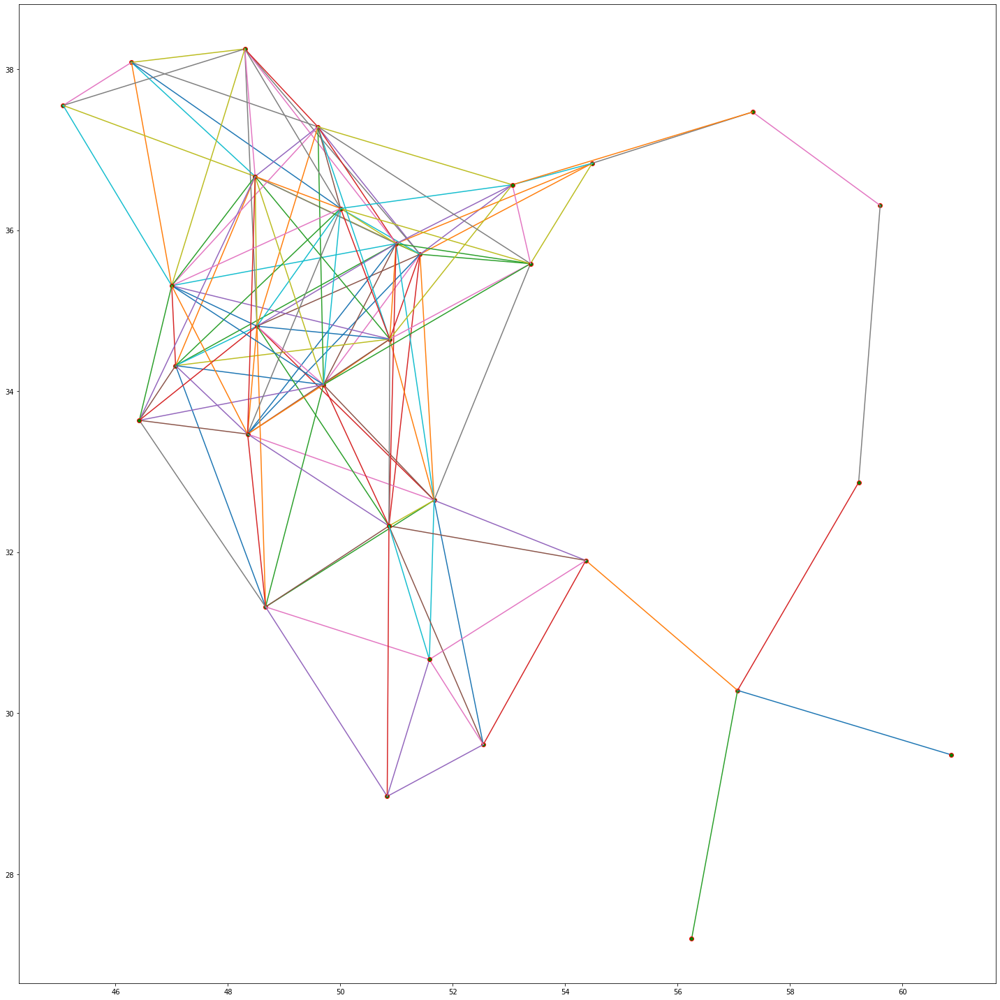

In [402]:
city_graph.draw_graph()

### Question 11, SIGNAL PROCESSING

#### First, consider "temp" column as signal on graph

In [214]:
signal = np.array(capitals_data['Temp']).astype(np.float)

type(signal[0])

D:\PythonDo\Conda\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """Entry point for launching an IPython kernel.


numpy.float64

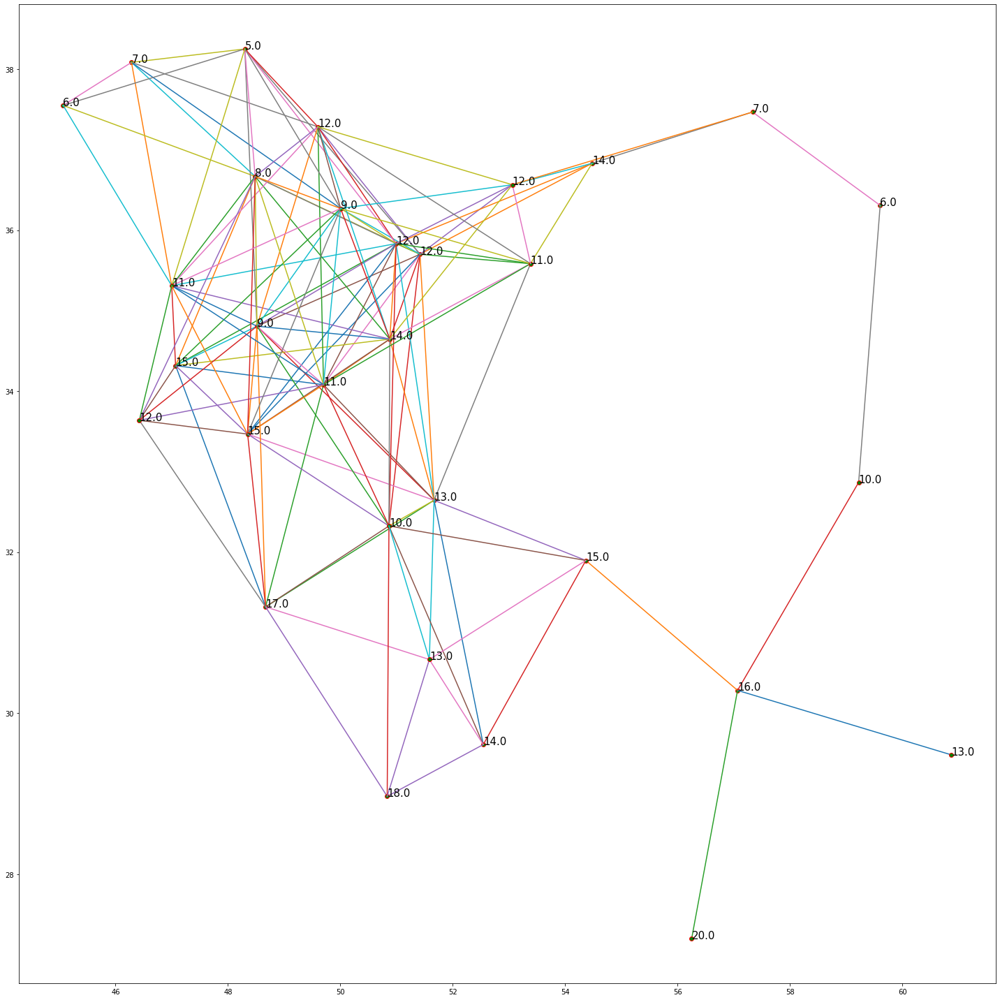

In [251]:
city_graph.plot_signal(signal, 15)

#### Now, run Pyramid, for N = 3 and flag = 0

In [291]:
N = 3
flag = 0

flag_0_interp_error = []
output = myPyramidAnalysis(signal, city_graph, N, flag)

0 level in progress ...
nodes to keep:  [ 0  1  7  8  9 12 14 15 16 17 19 20 22 28]
1 level in progress ...
nodes to keep:  [ 0  1  2  3  5  8  9 11]
2 level in progress ...
nodes to keep:  [0 2 4 6 7]


### For step 1:

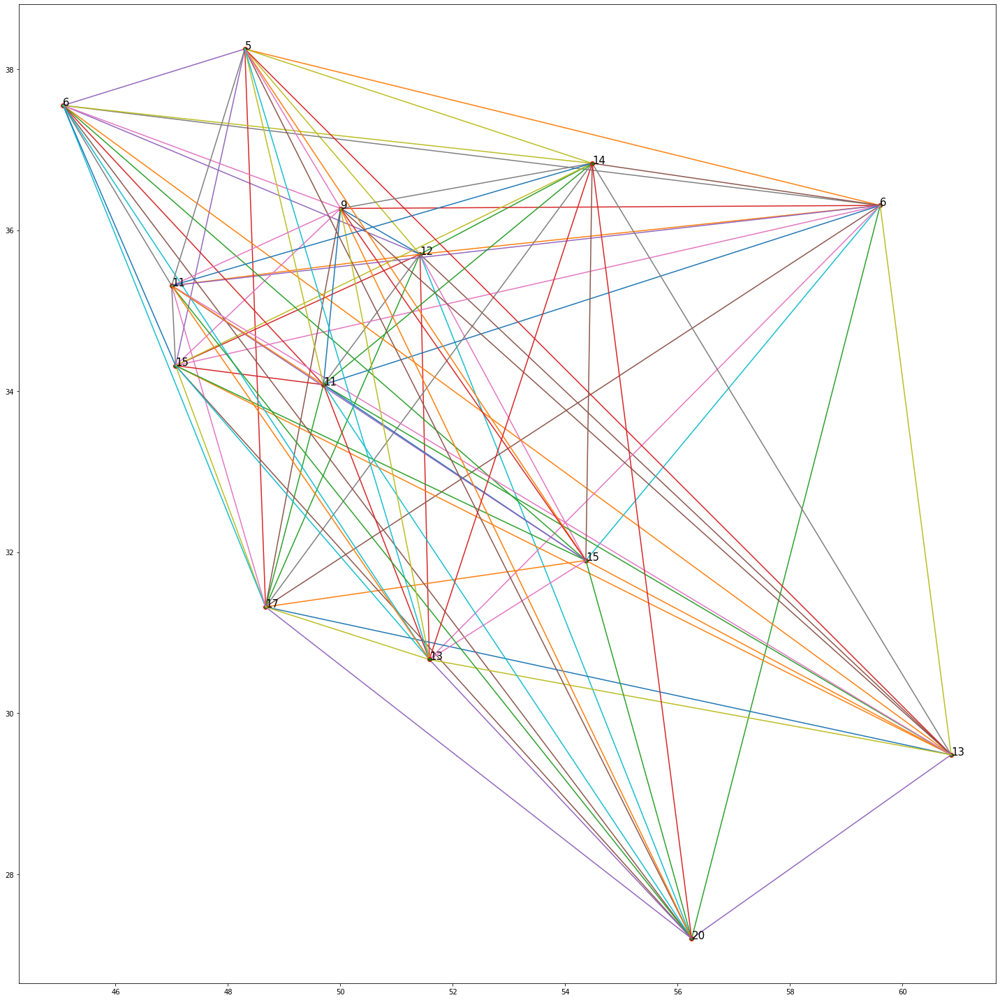

In [292]:
reducted_graph = output[1]['reducted_graph']
downsampled_signal = output[1]['downsampled_x']
interpolation_error = output[1]['interpolation_error']

flag_0_interp_error.append(np.sum(interpolation_error ** 2) / len(interpolation_error))

reducted_graph.get_coords(coord_matrix[output[1]['v_to_keep'], :])

reducted_graph.plot_signal(downsampled_signal, 15)

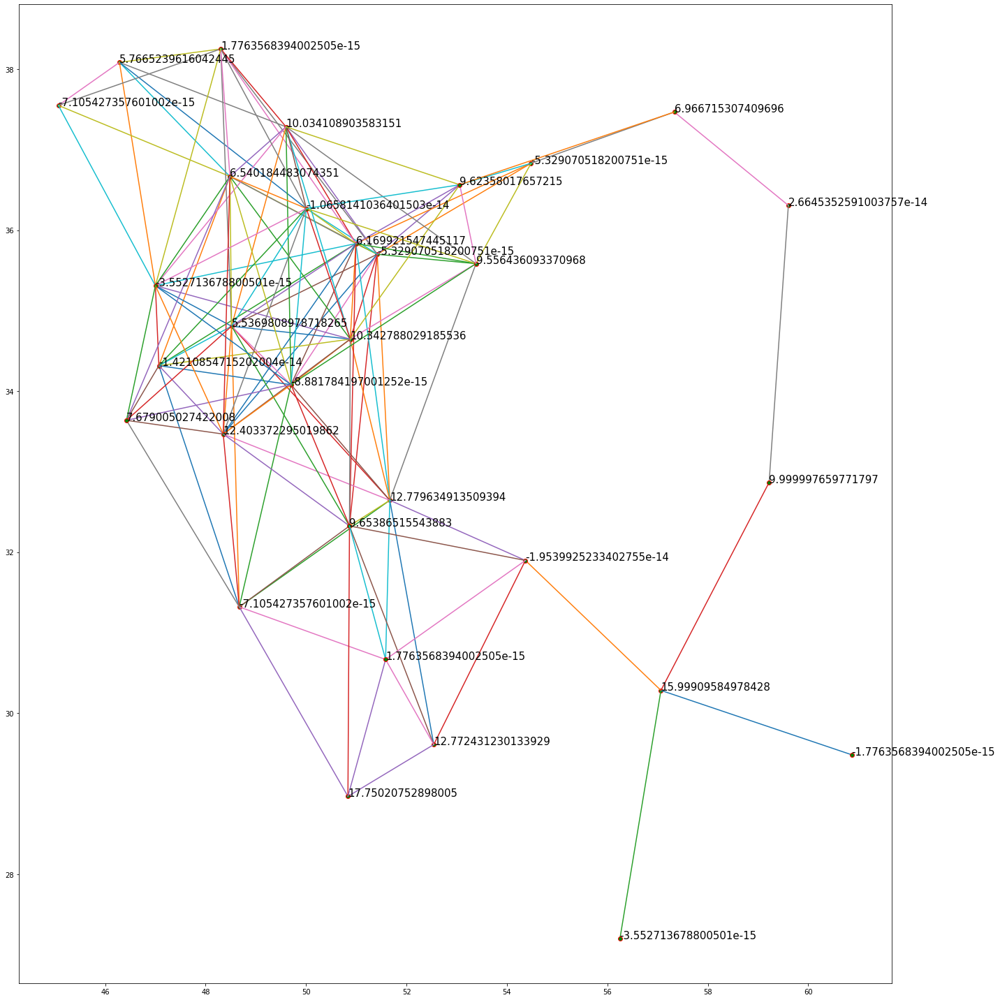

In [293]:
city_graph.plot_signal(interpolation_error, 15)

### For step 2

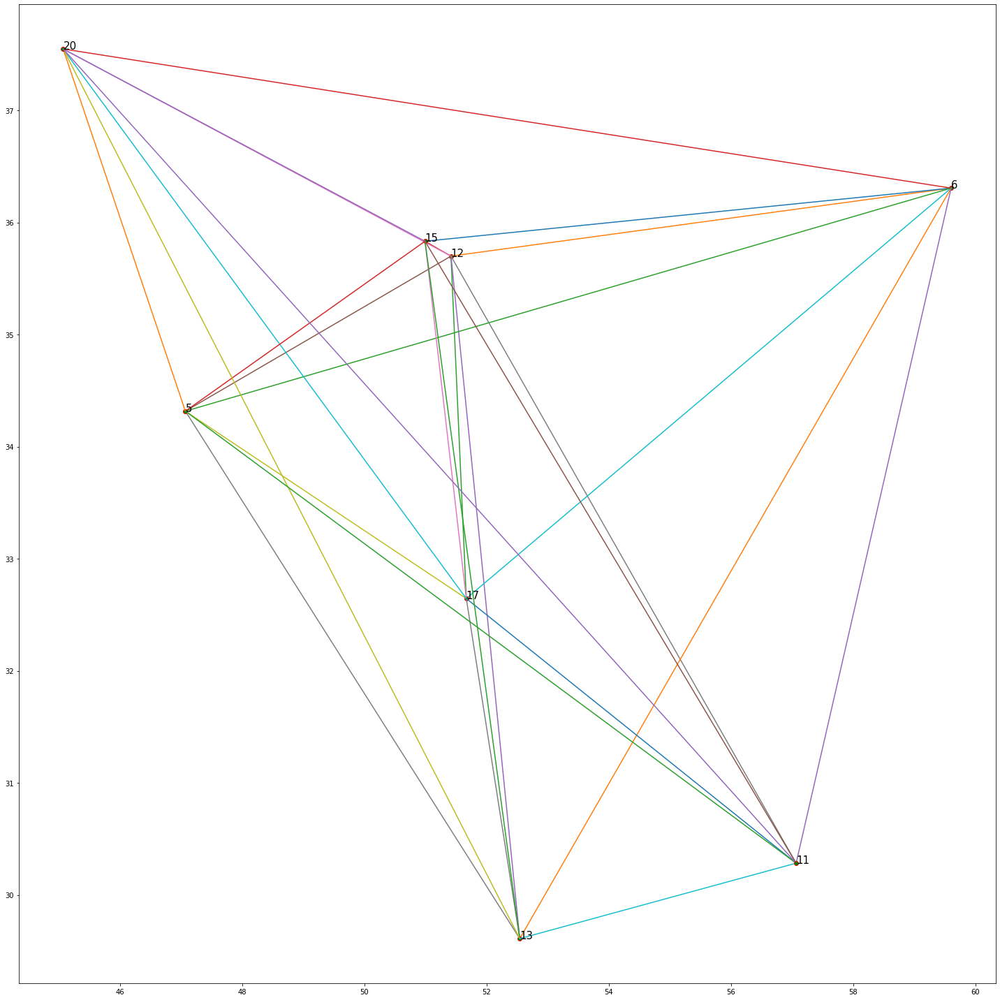

In [294]:
reducted_graph = output[2]['reducted_graph']
downsampled_signal = output[2]['downsampled_x']
interpolation_error = output[2]['interpolation_error']

flag_0_interp_error.append(np.sum(interpolation_error ** 2) / len(interpolation_error))

reducted_graph.get_coords(coord_matrix[output[2]['v_to_keep'], :])

reducted_graph.plot_signal(downsampled_signal, 15)

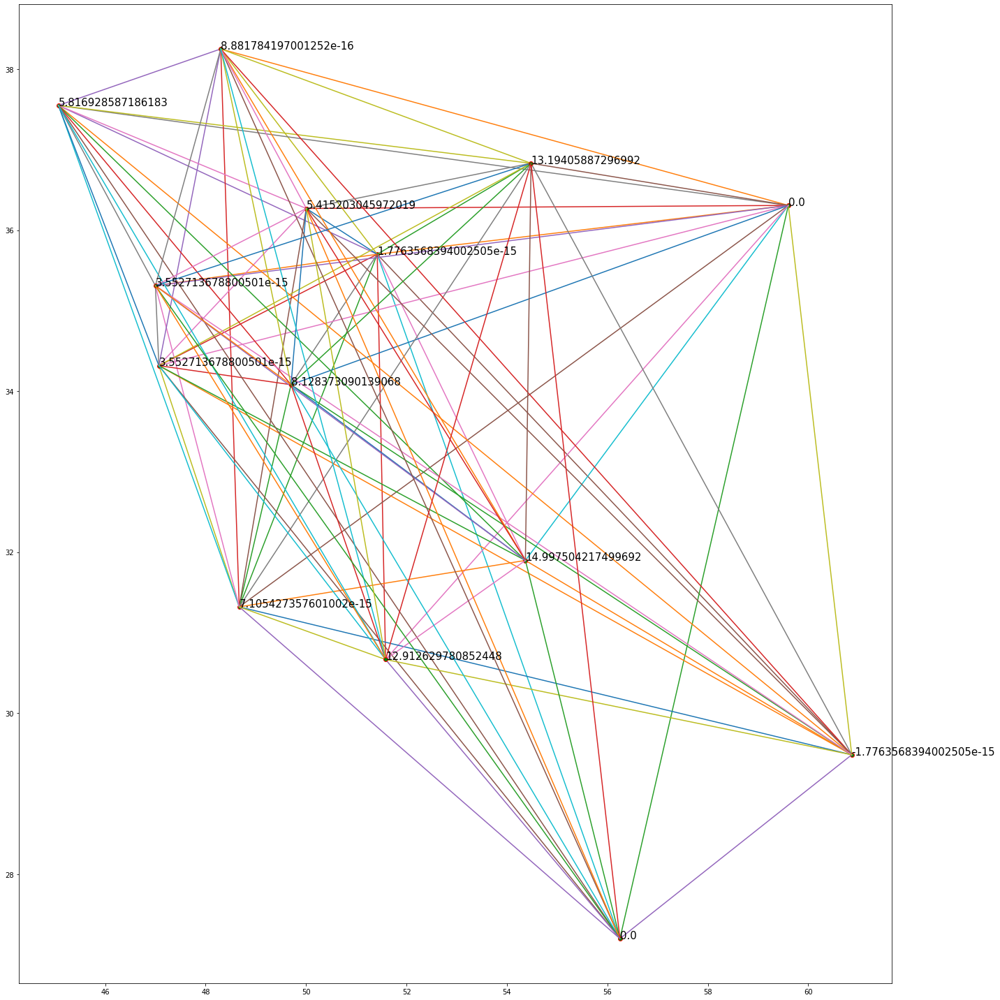

In [295]:
output[1]['reducted_graph'].plot_signal(interpolation_error, 15)

### For step 3

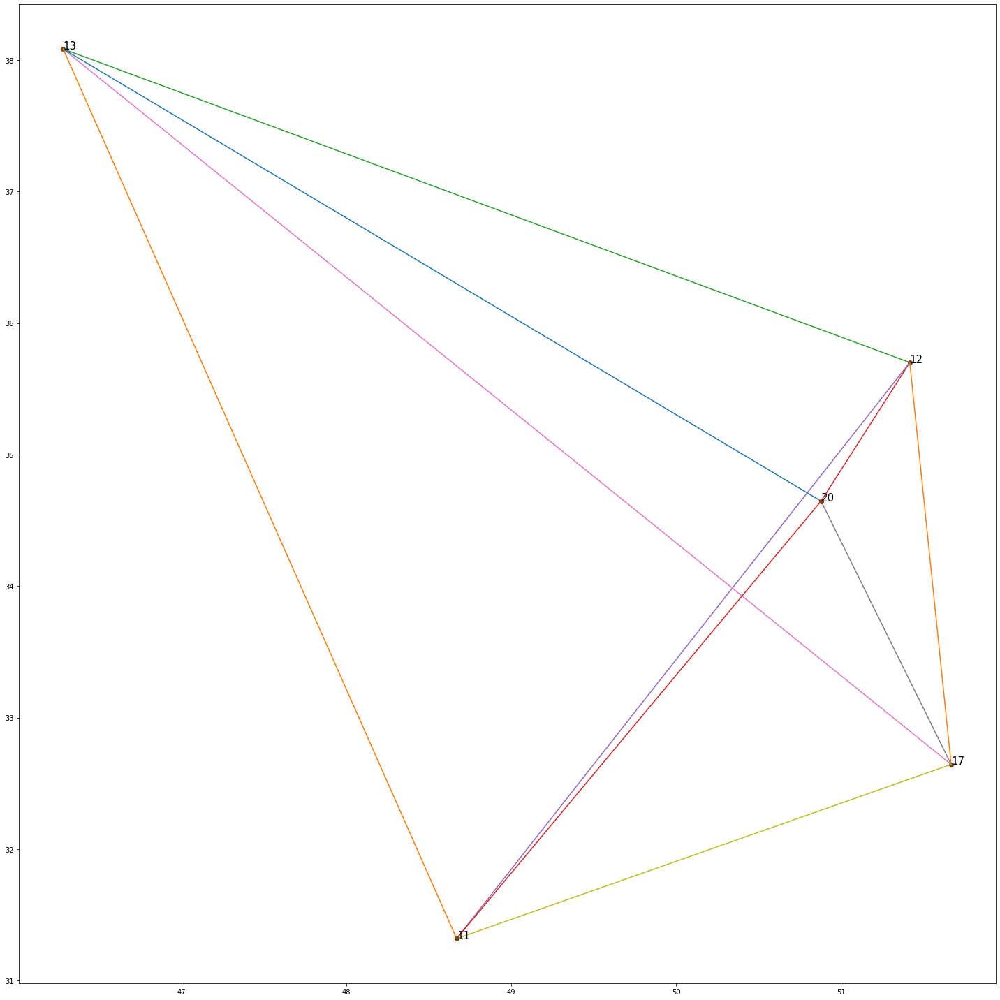

In [296]:
reducted_graph = output[3]['reducted_graph']
downsampled_signal = output[3]['downsampled_x']
interpolation_error = output[3]['interpolation_error']

flag_0_interp_error.append(np.sum(interpolation_error ** 2) / len(interpolation_error))

reducted_graph.get_coords(coord_matrix[output[3]['v_to_keep'], :])

reducted_graph.plot_signal(downsampled_signal, 15)

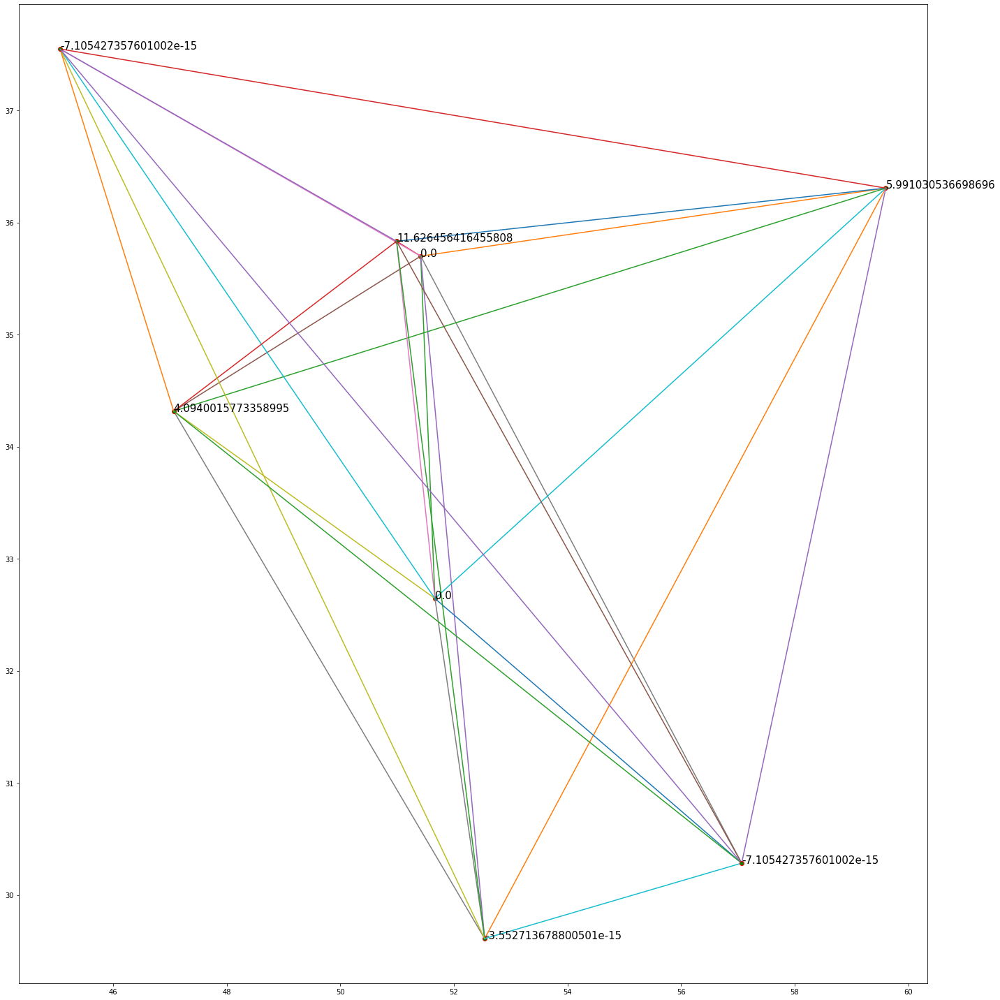

In [297]:
output[2]['reducted_graph'].plot_signal(interpolation_error, 15)

#### Now, run Pyramid, for N = 3 and flag = 1

In [299]:
N = 3
flag = 1

flag_1_interp_error = []
output = myPyramidAnalysis(signal, city_graph, N, flag)

0 level in progress ...
nodes to keep:  [ 0  1  7  8  9 12 14 15 16 17 19 20 22 28]
1 level in progress ...
nodes to keep:  [ 0  1  2  3  5  8  9 11]
2 level in progress ...
nodes to keep:  [0 2 4 6 7]


### For step 1

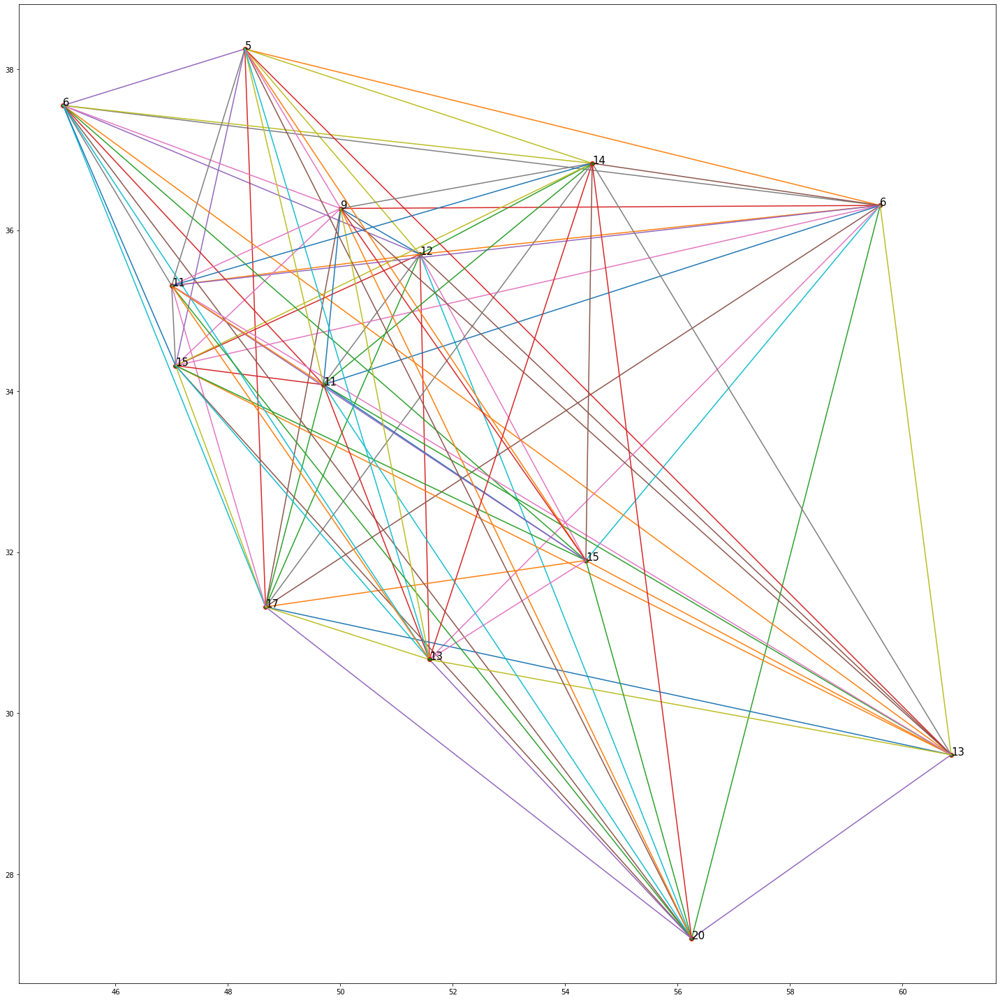

In [300]:
reducted_graph = output[1]['reducted_graph']
downsampled_signal = output[1]['downsampled_x']
interpolation_error = output[1]['interpolation_error']

flag_1_interp_error.append(np.sum(interpolation_error ** 2) / len(interpolation_error))

reducted_graph.get_coords(coord_matrix[output[1]['v_to_keep'], :])

reducted_graph.plot_signal(downsampled_signal, 15)

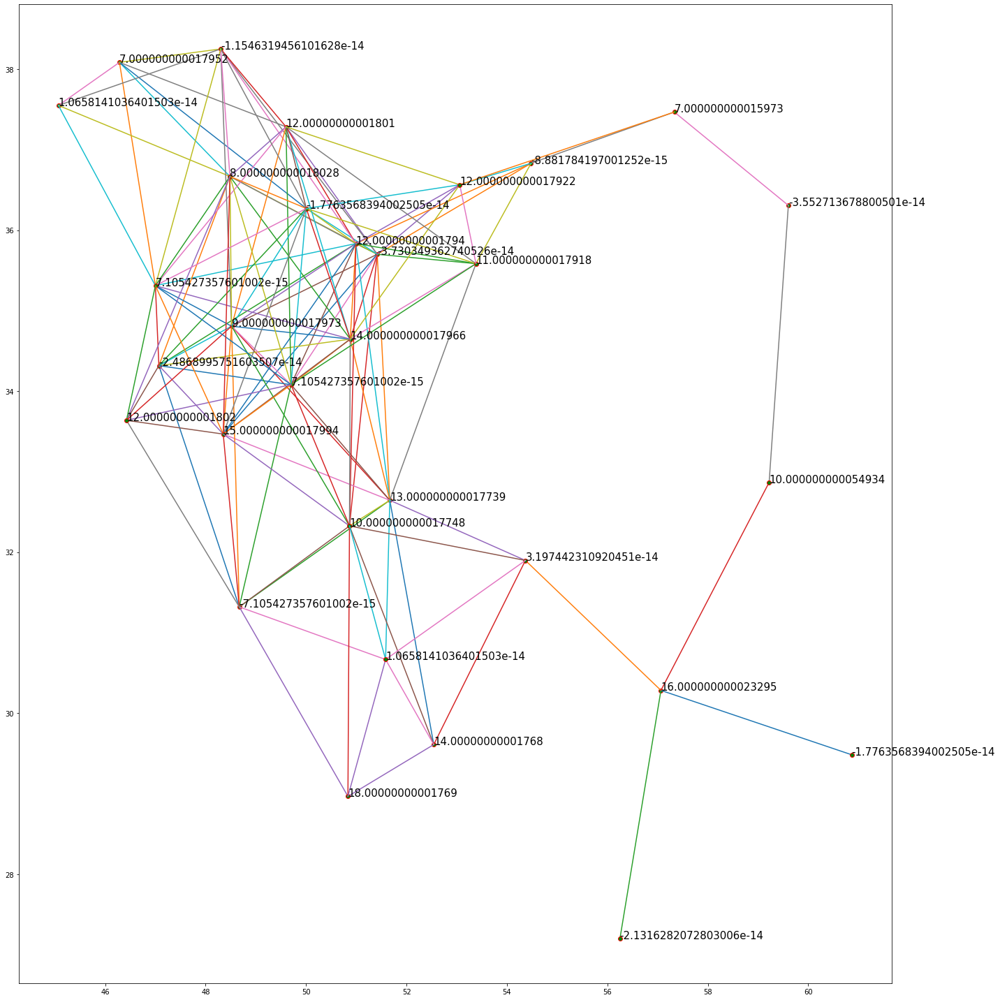

In [301]:
city_graph.plot_signal(interpolation_error, 15)

### For step 2

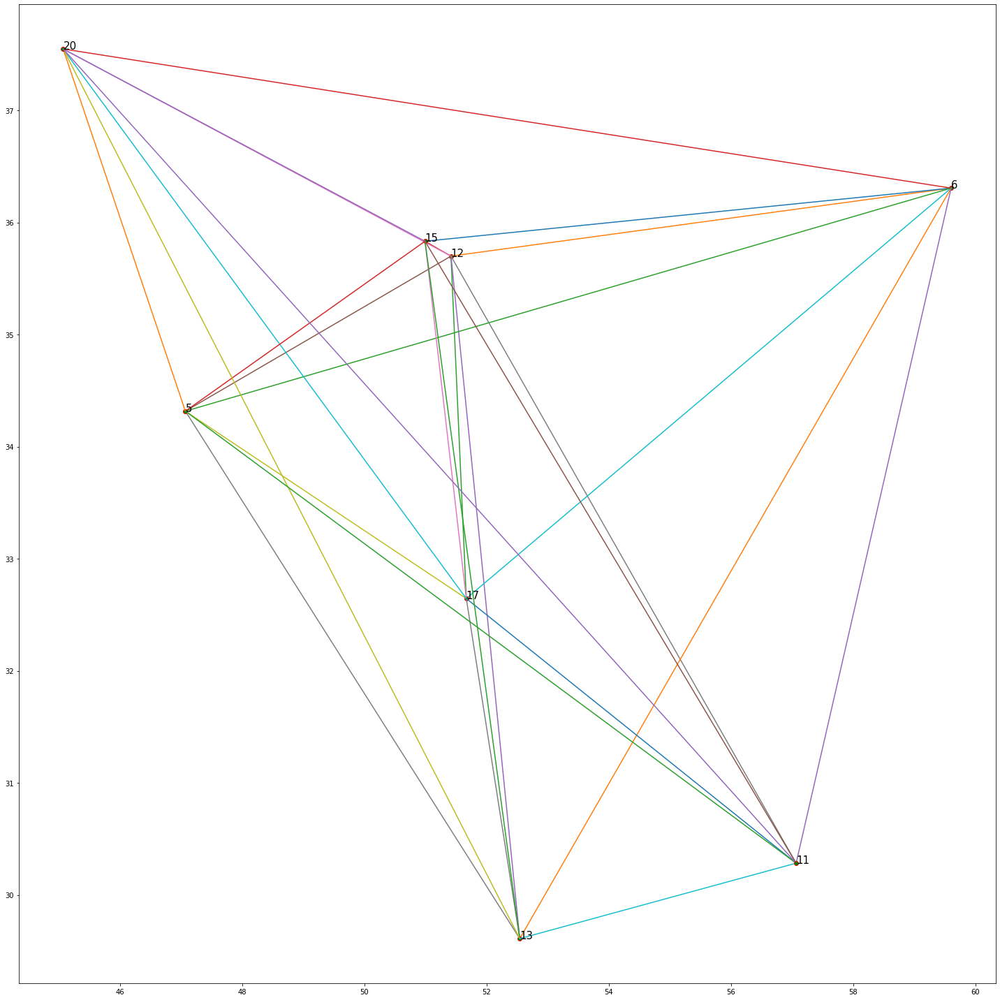

In [302]:
reducted_graph = output[2]['reducted_graph']
downsampled_signal = output[2]['downsampled_x']
interpolation_error = output[2]['interpolation_error']

flag_1_interp_error.append(np.sum(interpolation_error ** 2) / len(interpolation_error))

reducted_graph.get_coords(coord_matrix[output[2]['v_to_keep'], :])

reducted_graph.plot_signal(downsampled_signal, 15)

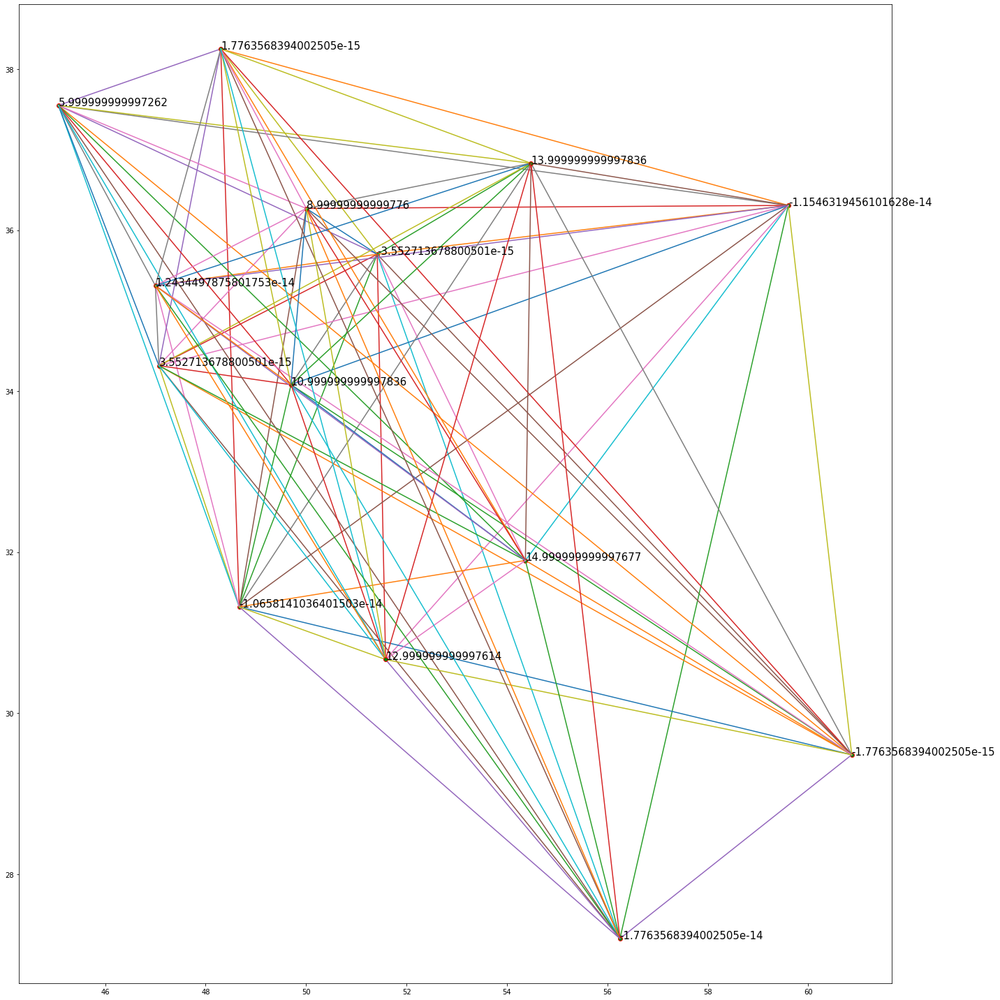

In [303]:
output[1]['reducted_graph'].plot_signal(interpolation_error, 15)

### For step 3

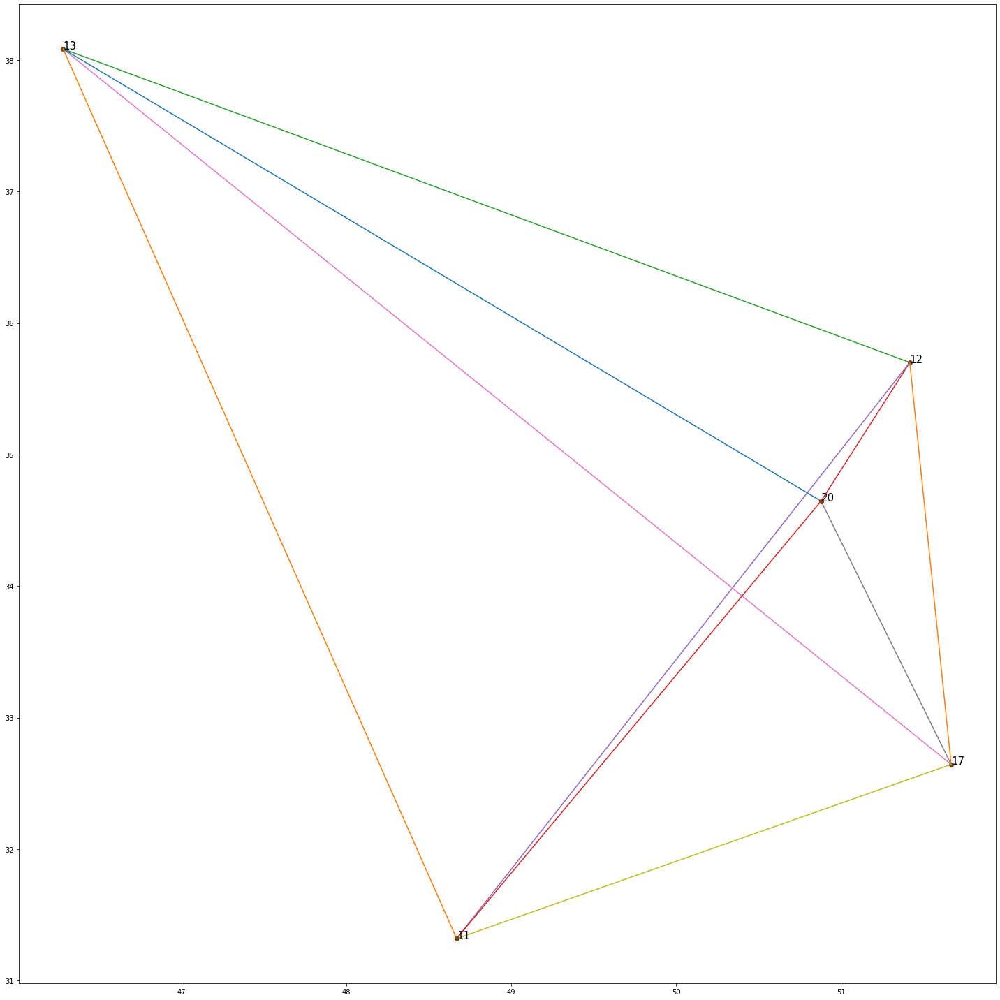

In [306]:
reducted_graph = output[3]['reducted_graph']
downsampled_signal = output[3]['downsampled_x']
interpolation_error = output[3]['interpolation_error']

flag_1_interp_error.append(np.sum(interpolation_error ** 2) / len(interpolation_error))

reducted_graph.get_coords(coord_matrix[output[3]['v_to_keep'], :])

reducted_graph.plot_signal(downsampled_signal, 15)

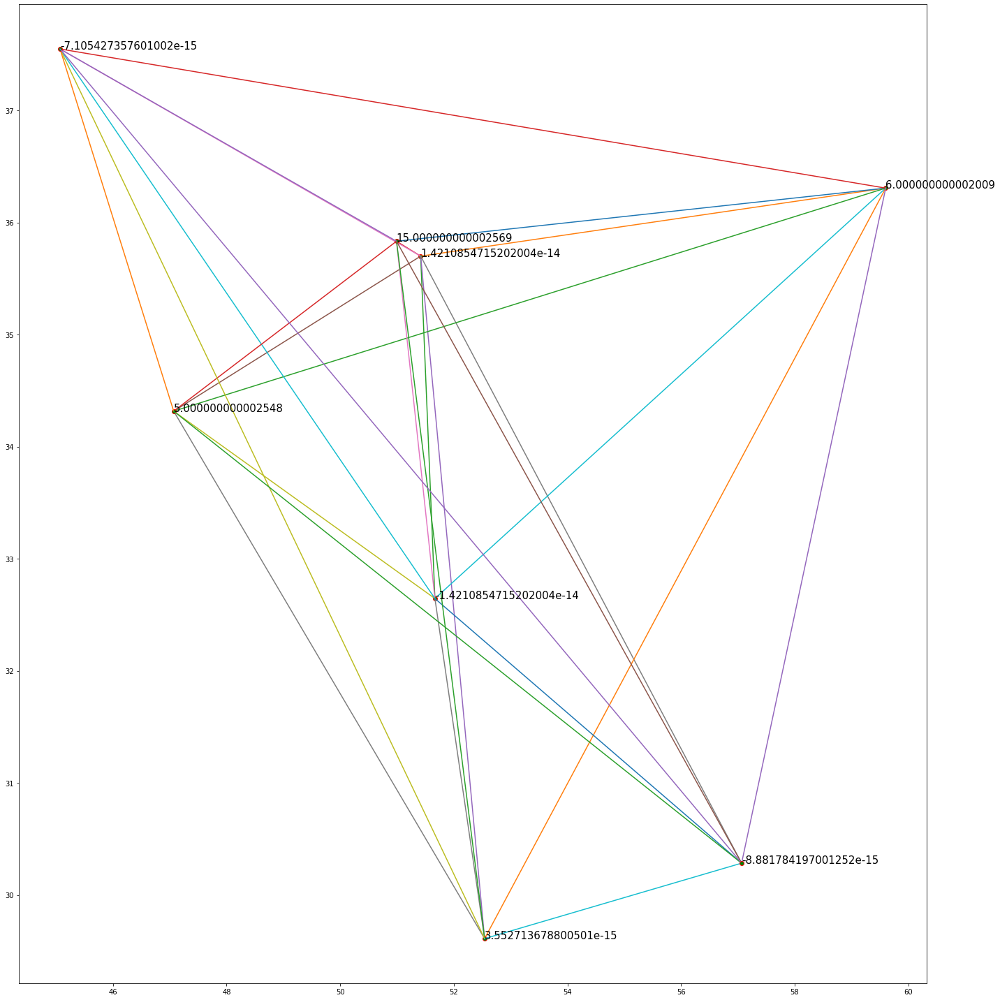

In [307]:
output[2]['reducted_graph'].plot_signal(interpolation_error, 15)

In [316]:
print("Interpolation error for flag = 0 (Article method) in three steps are:\n", "step 1:", flag_0_interp_error[0], "\n step 2:", flag_0_interp_error[1], "\n step 3:", flag_0_interp_error[2])
print("\n\nInterpolation error for flag = 1 (Lecture notes method) in three steps are:\n", "step 1:", flag_1_interp_error[0], "\n step 2:", flag_1_interp_error[1], "\n step 3:", flag_1_interp_error[2])

Interpolation error for flag = 0 (Article method) in three steps are:
 step 1: 60.91568473088902 
 step 2: 49.641132961764306 
 step 3: 23.47847307632894


Interpolation error for flag = 1 (Lecture notes method) in three steps are:
 step 1: 80.83870967767878 
 step 2: 59.14285714283478 
 step 3: 35.75000000001583


* As you see, interpolation error, using first method (article one) is less than the lecture note's method, but there is not a huge difference between them, we shall say that in this graph structure, article method works better!

### Question 12, Recinstructing First Signal ...

#### In this step, we use our pyramid synthesis to reconstruct first temperature signal

In [334]:
reconstructing_signals = myPyramidSynthesis(output, flag)

#### The last array of above list, is reconstructed signal of temperature

In [336]:
interpolated_signal = reconstructing_signals[2]
error = signal - interpolated_signal

print(np.sum(error ** 2))

0.0


#### Reconstructed signal on main graph

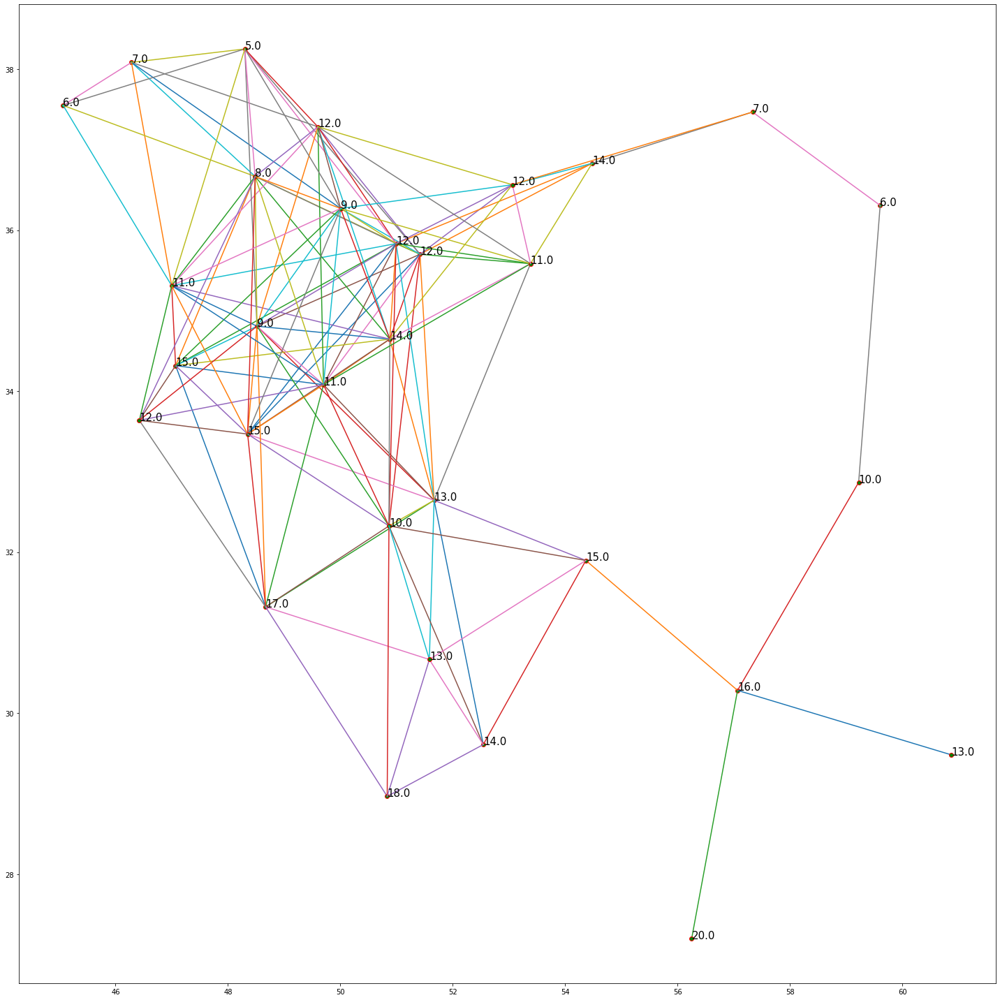

In [337]:
city_graph.plot_signal(interpolated_signal, 15)

### Question 13, Noise on signal ...

In [383]:
signal_ = output[3]['downsampled_x']
signal_power = np.sum(signal_ **2)
noise_power = signal_power * 10 ** 0.5

noise = np.random.normal(0, 10, signal_.shape)
noisy_signal = signal_ + noise

print(noisy_signal, signal_)

[-5.37987255  9.58685192 16.55406063 15.21500945  8.10222297] [12 17 13 20 11]


In [384]:
10 * np.log10(signal_power / np.sum((signal_ - noisy_signal) ** 2))

4.473010987625962

#### Now, we reconstruct signals, using noisy signal

In [393]:
output_noisy = output
output_noisy[3]['downsampled_x'] = noisy_signal

reconstructing_noisy_signals = myPyramidSynthesis(output_noisy, flag)

In [396]:
interpolated_noisy_signal = reconstructing_noisy_signals[2]
error = signal - interpolated_noisy_signal

print(np.sum(error ** 2) / len(error))

80.83870967767878


## Part 3

### Question 14, solving ODE

#### first, for 5 days

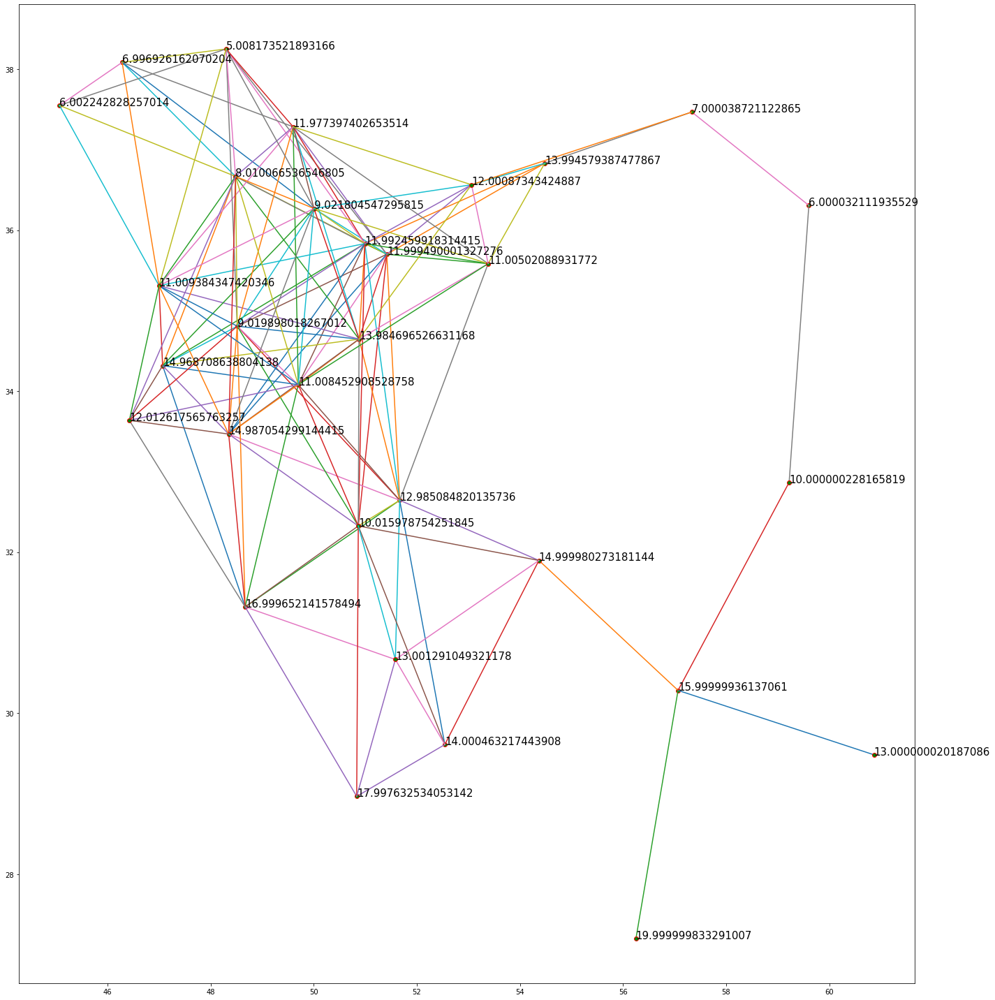

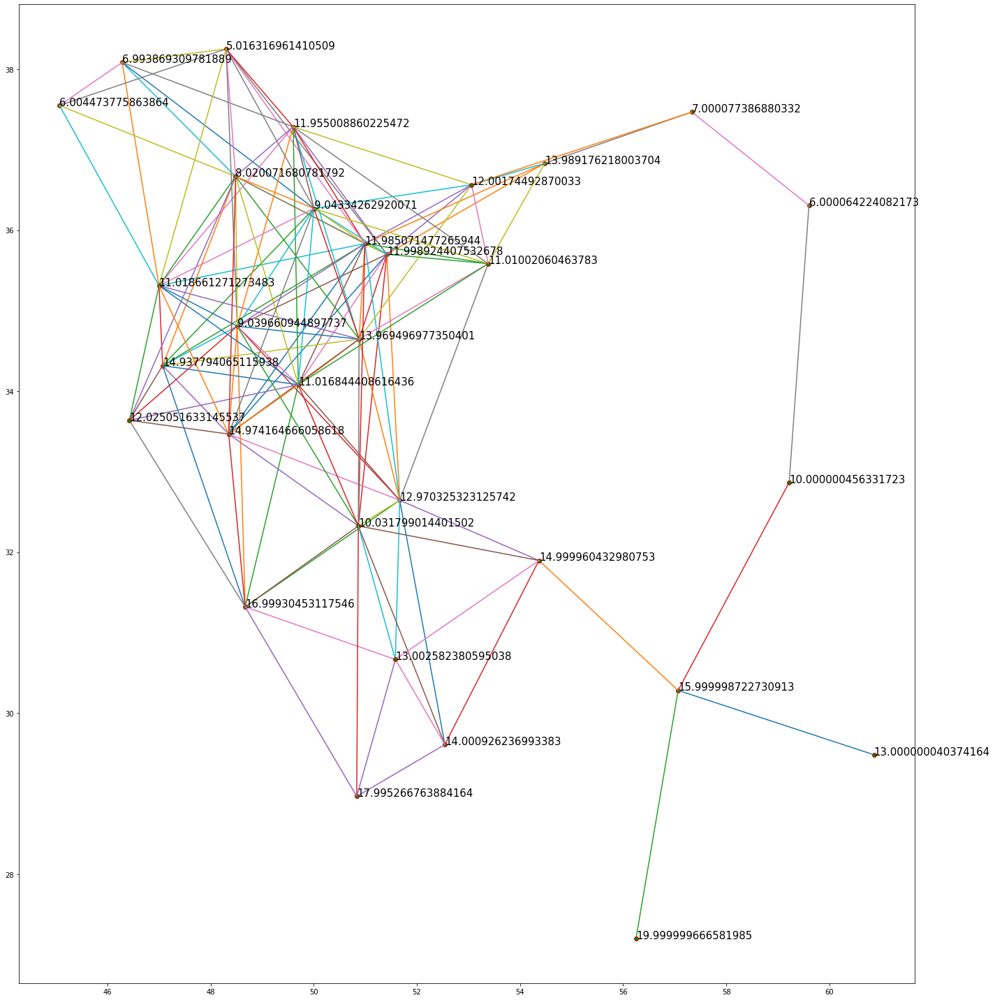

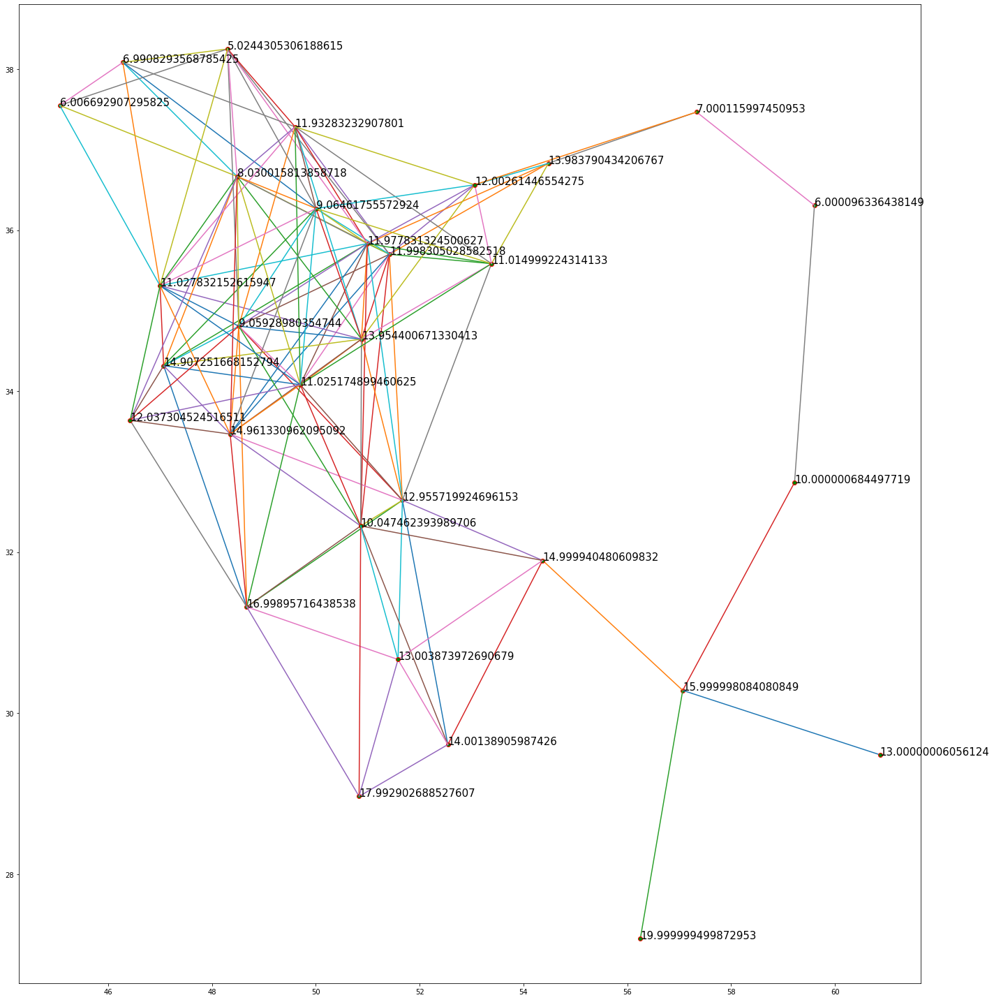

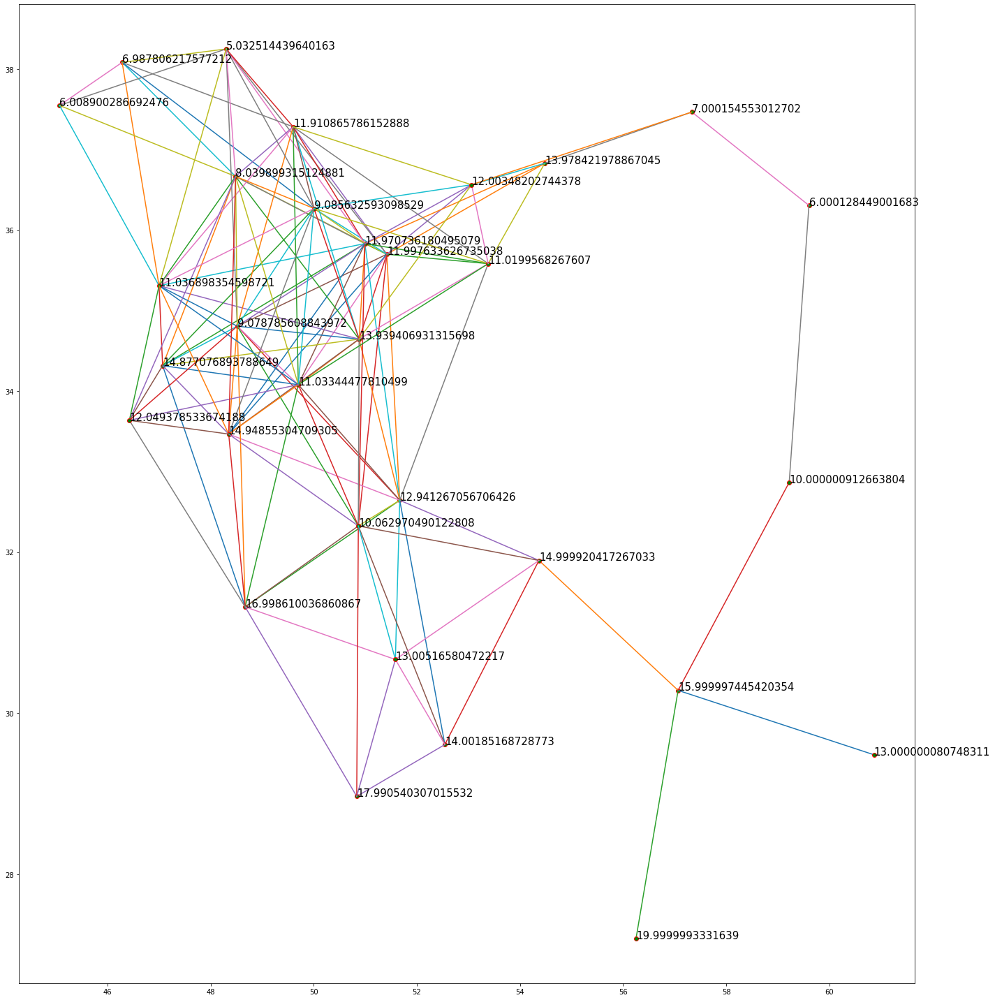

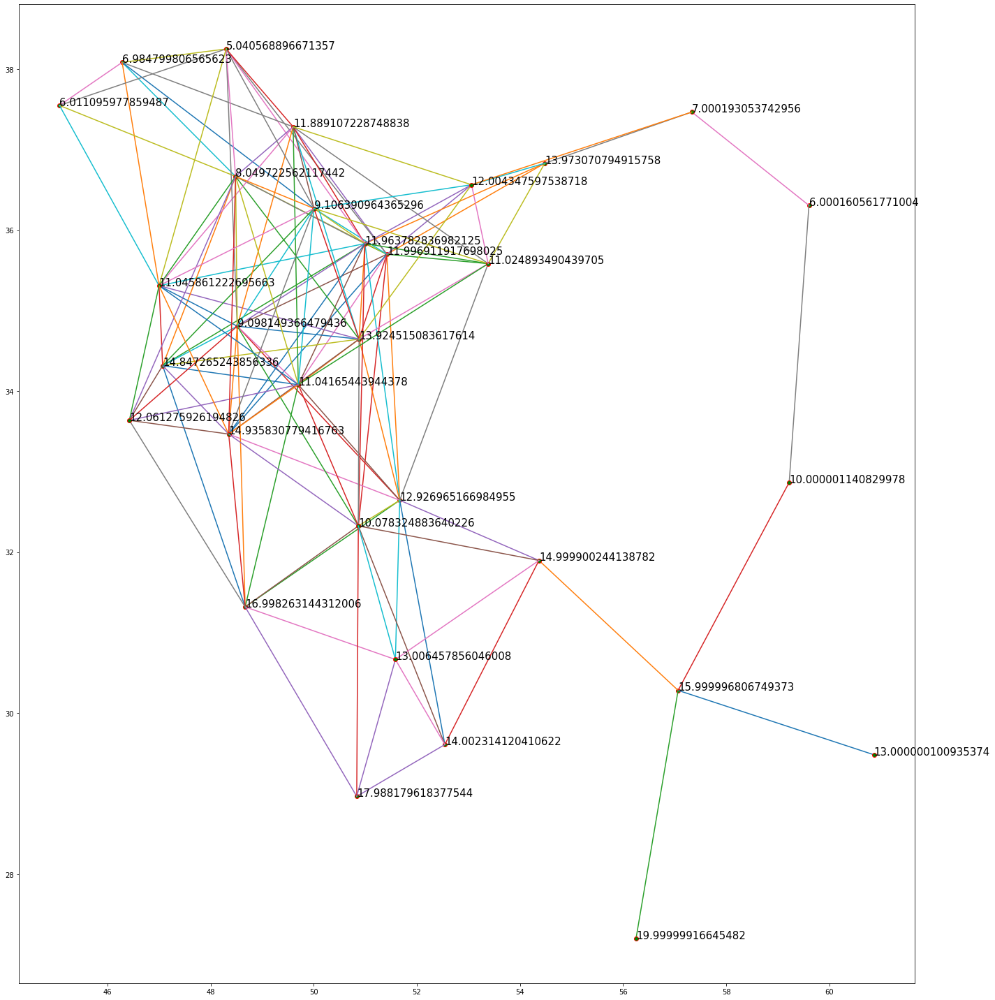

In [415]:
signal_overdays = []
signal_overdays.append(signal)

N_days = 5
c = 0.01

lambd, u = LA.eig(city_graph.laplacian)
x_tmp = signal

for i in range(N_days):
    
    x_tmp = np.dot(u, np.dot(np.diag(np.exp(-c * lambd)), np.dot(LA.pinv(u), x_tmp)))
    
    city_graph.plot_signal(x_tmp, 15)
    signal_overdays.append(x_tmp)

#### Then, now for steady state

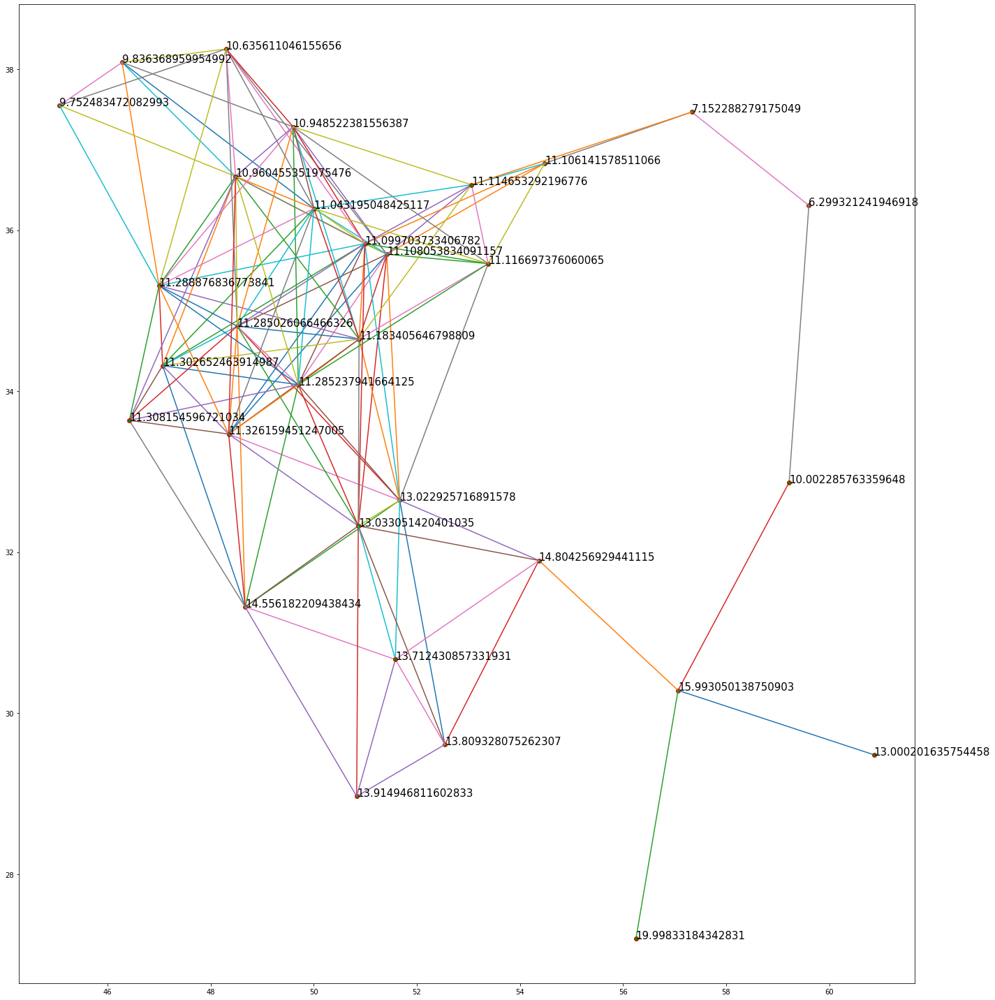

In [416]:
x_tmp = signal

for i in range(10000):
    
    x_tmp = np.dot(u, np.dot(np.diag(np.exp(-c * lambd)), np.dot(LA.pinv(u), x_tmp)))
    

signal_overdays.append(x_tmp)  
city_graph.plot_signal(x_tmp, 15)

#### Plotting temperature signals over days!

D:\PythonDo\Conda\lib\site-packages\ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


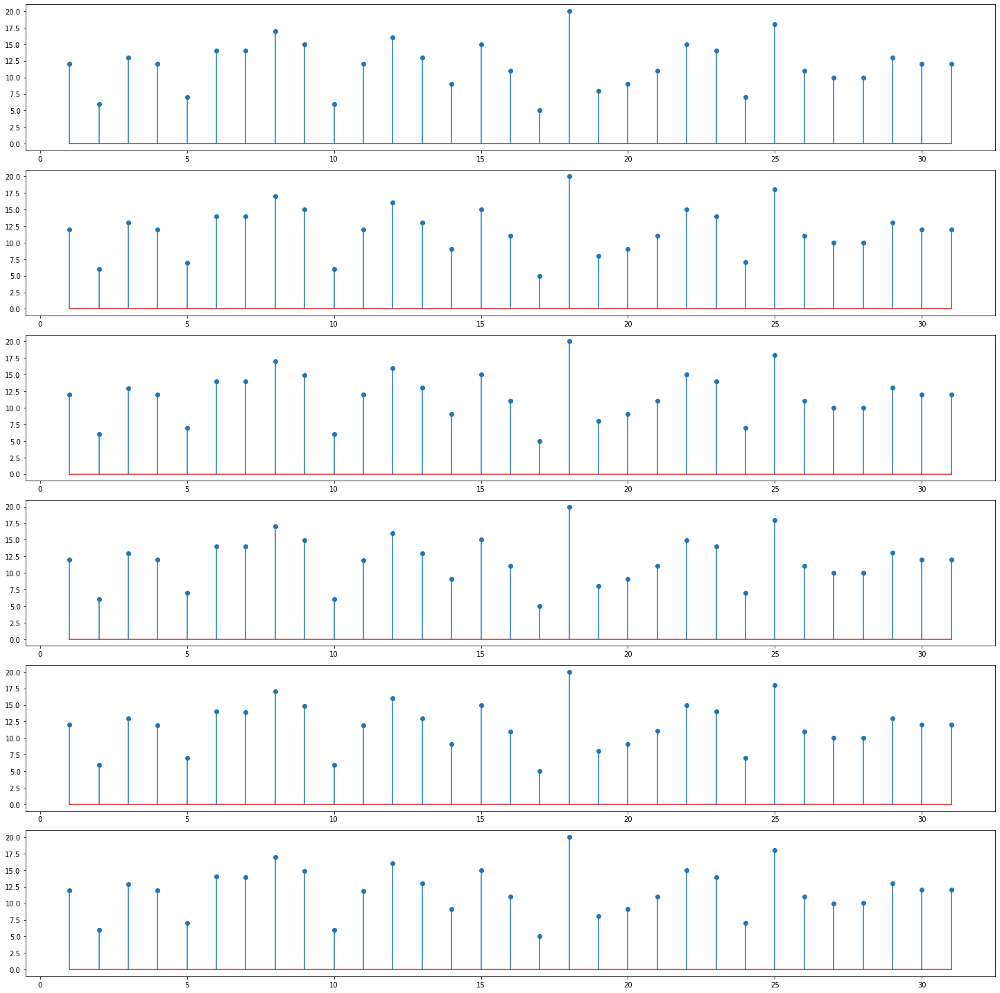

In [418]:
for i in range(0, N_days + 1):
    
    plt.subplot(N_days + 1, 1, i + 1)
    plt.stem(np.arange(1, 32), signal_overdays[i])
    
plt.show()

#### as you see, changing during days is negligible, it seems that signal in t - 0 is smooth enough